# Then and Now: A Parakeet Story
## *Told with data from the [Cornell Bird Lab's eBird API](https://ebird.org/explore)*

-------
### The Carolina Parakeet, *Conuropsis carolinensis*
<img src="./resources/carolina.jpg" alt="John James Audubon's 'Carolina Parakeets,' from the permanent collection at the New York Historical Society" style="border: 1px solid darkgray" align="left" width="300px">

<span style="color:darkgreen">
The Carolina Parakeet was once common in the United States -- it ranged from the swamps of Florida to the Ohio River Valley.  As early as the 1700s, naturalists began noticing a decline in the parakeet's numbers.  Its population dropped precipitously in the 1800s, and by the early 1900s, it was functionally gone from the wild.  The last wild Carolina Parakeet was spotted in 1915; the species was declared extinct in 1939.

With user-generated data from the Cornell Bird Lab, we can take a look at some of the last recorded sightings of the Carolina Parakeet in the US.

Thanks to programs like the R. Dale Twining project, nature journals, personal diaries, and birding lists of long-deceased ornithologists and even amateur birders have been preserved digitally.  While the eBird API is more commonly used to display recent birding observations, we searched the oldest dates in eBird for sightings of the Carolina Parakeet--elusive even in the 1800s!

This project not only provided a snapshot in time as one of America's most stunning birds was fading from existence; it also connected our team to the personal histories of birdwatchers from long ago.

In [1]:
import pandas as pd
from config import mapbox_token
import plotly.express as px
import plotly.graph_objs as go
import os
import numpy as np
from datetime import datetime
import calendar


%reload_ext lab_black

px.set_mapbox_access_token(mapbox_token)

In [2]:
# Resource paths
DATES_WITH_DATA = os.path.join("resources", "dates_with_data_1800-1999.csv")
CAROLINA_PARAKEETS = os.path.join("resources", "carolina_parakeets.csv")
FLORIDA_PARAKEETS = os.path.join("resources", "florida_parakeets.csv")
AUSTIN_PARAKEETS = os.path.join("resources", "austin_parakeets.csv")

### Historic Data... *How much is there?*
<span style="color:darkgreen">
First we scraped the API to find which dates had contributors in the database.  It's important to note that eBird tracks *observations of birds,* not actual bird populations.

We found that from 1800-1999, there were nearly 35,000 days with data!

In [3]:
# Read in data on numbers of observations & contributors per day from 1800-1999
date_headers_separated = ["year", "month", "day"]

dates_df = pd.read_csv(DATES_WITH_DATA)
dates_df["Date"] = pd.to_datetime(dates_df[date_headers_separated])
dates_df = dates_df.drop(date_headers_separated, axis=1)

move_col = dates_df.pop("Date")
dates_df.insert(0, "Date", move_col)

dates_df

,Date,checklists,contributors,species
0,1800-01-01,3,25,5
1,1800-02-01,0,1,0
2,1800-10-02,0,1,0
3,1800-10-14,1,1,0
4,1800-12-01,0,1,0
...,...,...,...,...
34965,1999-12-27,120,178,363
34966,1999-12-28,138,204,368
34967,1999-12-29,149,194,361
34968,1999-12-30,191,213,380


<span style="color:darkgreen">
The database entries came primarily from observations after 1950, but there were many dates with data even far earlier than that!

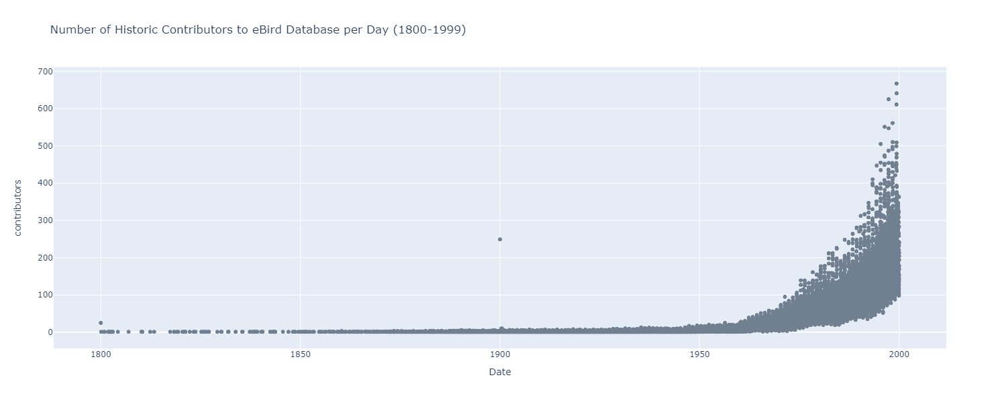

In [4]:
fig = px.scatter(
    dates_df,
    x="Date",
    y="contributors",
    color_discrete_sequence=["slategray"],
    title="Number of Historic Contributors to eBird Database per Day (1800-1999)",
    width=1000,
    height=600,
)
fig.show()

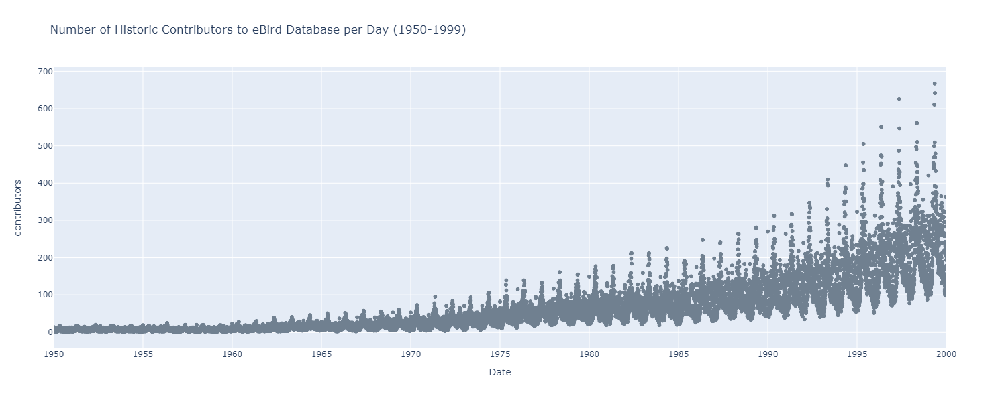

In [5]:
fig = px.scatter(
    dates_df,
    x="Date",
    y="contributors",
    color_discrete_sequence=["slategray"],
    range_x=[pd.to_datetime(["1950-01-01"])[0], pd.to_datetime(["2000-01-01"])[0]],
    title="Number of Historic Contributors to eBird Database per Day (1950-1999)",
    width=1000,
    height=600,
)
fig.show()

<span style="color:darkgreen">
Most observations are made in the summer months...

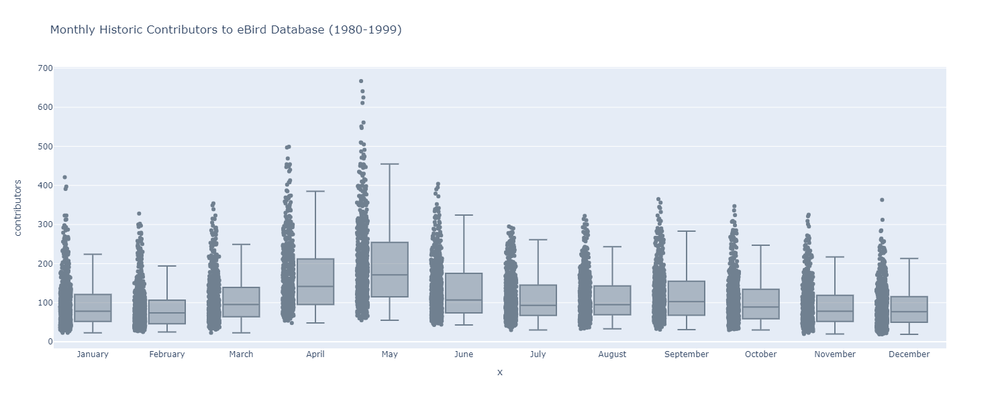

In [6]:
since_1980_df = dates_df.loc[dates_df["Date"] > pd.to_datetime(["1980-01-01"])[0]]

months = []
for month in np.arange(1, 13):
    months.append(calendar.month_name[month])

fig = px.box(
    since_1980_df,
    x=pd.DatetimeIndex(since_1980_df["Date"]).month,
    y="contributors",
    points="all",
    color_discrete_sequence=["slategray"],
    title="Monthly Historic Contributors to eBird Database (1980-1999)",
    width=1000,
    height=600,
)

fig.update_layout(
    xaxis=dict(tickmode="array", tickvals=np.arange(1, 13), ticktext=months)
)
fig.show()

<span style="color:darkgreen">
...and on the weekends.

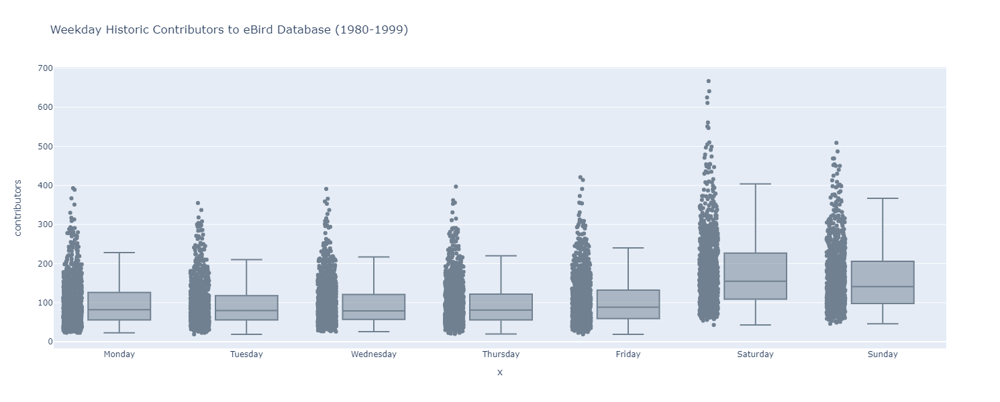

In [9]:
since_1980_df = dates_df.loc[dates_df["Date"] > pd.to_datetime(["1980-01-01"])[0]]

weekdays = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

fig = px.box(
    since_1980_df,
    x=pd.DatetimeIndex(since_1980_df["Date"]).weekday,
    y="contributors",
    points="all",
    color_discrete_sequence=["slategray"],
    title="Weekday Historic Contributors to eBird Database (1980-1999)",
    width=1000,
    height=600,
)

fig.update_layout(
    xaxis=dict(tickmode="array", tickvals=np.arange(0, 7), ticktext=weekdays)
)
fig.show()

### Final Sightings of the Carolina Parakeet
<span style="color:darkgreen">
Before the Carolina Parakeet went extinct, the eBird dataset records 18 reported sightings, ranging from the year 1810-1881.

In [11]:
columns_dict = {
    "comName": "Species",
    "sciName": "Scientific Name",
    "locName": "Location",
    "obsDt": "Date",
    "howMany": "Number Seen",
    "lat": "Latitude",
    "lng": "Longitude",
}

carolina_df = (
    pd.read_csv(CAROLINA_PARAKEETS)
    .drop(
        ["speciesCode", "locId", "obsValid", "obsReviewed", "locationPrivate", "subId"],
        axis=1,
    )
    .rename(columns=columns_dict)
)

carolina_df["Number Seen"] = carolina_df["Number Seen"].fillna(1)
carolina_df["Decade"] = pd.DatetimeIndex(carolina_df["Date"]).year // 10 * 10

carolina_df

,Species,Scientific Name,Location,Date,Number Seen,Latitude,Longitude,Decade
0,Carolina Parakeet,Conuropsis carolinensis,10 miles north of Nashville,1810-04-25,1.0,36.357716,-86.796327,1810
1,Carolina Parakeet,Conuropsis carolinensis,"Alabama River, near old Rutherford Plantation",1826-01-06,300.0,32.277953,-87.157073,1820
2,Carolina Parakeet,Conuropsis carolinensis,"Below Wiggins Landing, over three miles below ...",1826-01-08,1.0,31.340047,-87.767029,1820
3,Carolina Parakeet,Conuropsis carolinensis,Sandy Bridge inn (log cabin in 1831),1831-12-15,1.0,36.033672,-88.275600,1830
4,Carolina Parakeet,Conuropsis carolinensis,just outside 1831 Memphis-near Mississippi River,1831-12-22,4.0,35.132966,-90.063257,1830
5,Carolina Parakeet,Conuropsis carolinensis,Old Road to Selma from Old Saffold Plantation ...,1838-12-20 10:30,90.0,32.253604,-86.991978,1830
6,Carolina Parakeet,Conuropsis carolinensis,Mandarin,1870-01-01,1.0,30.155815,-81.624298,1870
7,Carolina Parakeet,Conuropsis carolinensis,St. Sebastian River Preserve SP (Brevard Co.),1885-02-01,1.0,27.824853,-80.606355,1880
8,Carolina Parakeet,Conuropsis carolinensis,Thonotosassa,1887-03-25,4.0,28.061400,-82.302310,1880
9,Carolina Parakeet,Conuropsis carolinensis,Ohio River at Little Scioto River mouth,1810-03-05,1.0,38.752392,-82.888413,1810


<span style="color:darkgreen">
<img src="./resources/carolina_range.jpg" alt="Historic range of the now-extinct Carolina Parakeet" align="left" width="400px">These last few observations of the dying species were spread throughout the Ohio River Valley and the southeastern United States, consistent with what scientists know of the parakeet's full range in the centuries before its extinction.

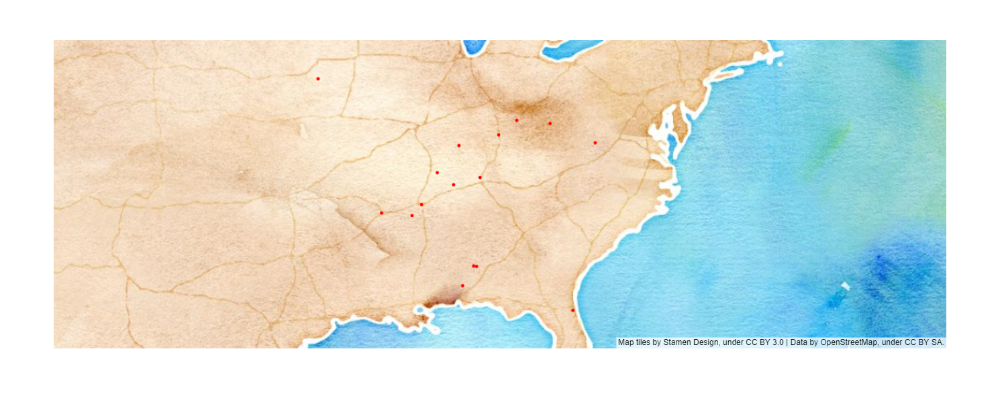

In [14]:
# Map historic observations of the now-extinct Carolina Parakeet

fig = px.scatter_mapbox(
    carolina_df,
    lat="Latitude",
    lon="Longitude",
    hover_name="Location",
    hover_data={"Date": "|%B %d, %Y", "Latitude": False, "Longitude": False},
    color_discrete_sequence=["red"],
    mapbox_style="stamen-watercolor",
    width=1000,
    height=600,
    zoom=4,
)
fig.show()

<span style="color:darkgreen">
In each decade of the 19th century, eBird lists no more than five observations.

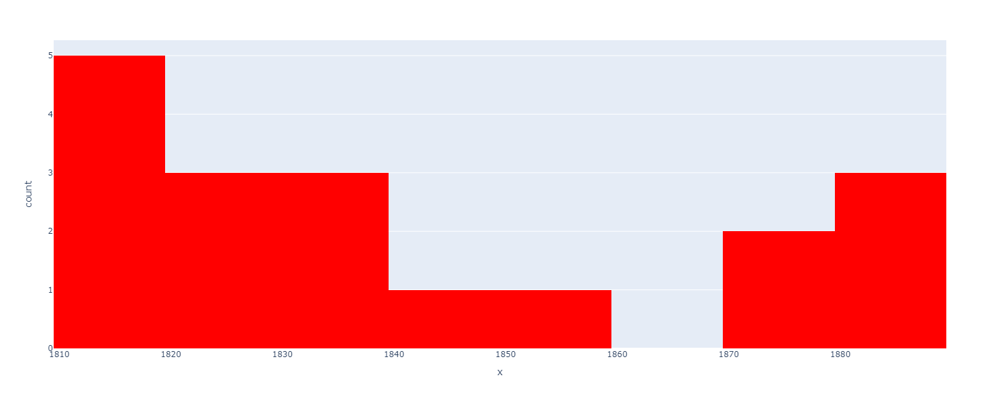

In [15]:
fig = px.histogram(
    x=carolina_df["Decade"],
    color_discrete_sequence=["red"],
    nbins=10,
    width=800,
    height=600,
)
fig.show()

### Introduction of the Monk Parakeet
<span style="color:darkgreen">
<img src="./resources/monk.jpg" alt="The monk parakeet, also known as the Quaker parrot, is a species of true parrot invasive to the United States" style="border: 1px solid darkgray" align="left" width="400px">In the 1960s, pet stores in the United States began importing the Monk Parakeet; however, several shipments of the birds got loose.  Over the course of the 60s and 70s, bird owners who released their pets into the wild and lost shipments of Monk Parakeets allowed small populations of the bird to become established, primarily in Florida.
   
We searched eBird for the first recorded sightings of the Monk Parakeet, and we found some of the earlierst observations beginning in 1975!

In [16]:
# Read in saved data on Monk Parakeets' arrival & population growth in Florida

florida_df = (
    pd.read_csv(FLORIDA_PARAKEETS)
    .drop(
        ["speciesCode", "locId", "obsValid", "obsReviewed", "locationPrivate", "subId"],
        axis=1,
    )
    .rename(columns=columns_dict)
)

florida_df["Decade"] = pd.DatetimeIndex(florida_df["Date"]).year // 10 * 10
florida_df["Number Seen"] = florida_df["Number Seen"].fillna(1)

florida_df

,Species,Scientific Name,Location,Date,Number Seen,Latitude,Longitude,Decade
0,Monk Parakeet,Myiopsitta monachus,Dinner Key,1975-04-26,1.0,25.727772,-80.235386,1970
1,Monk Parakeet,Myiopsitta monachus,University of Miami--main campus,1975-04-27,1.0,25.719614,-80.276971,1970
2,Monk Parakeet,Myiopsitta monachus,Hillsboro Club,1975-12-29 09:00,1.0,26.261636,-80.080865,1970
3,Monk Parakeet,Myiopsitta monachus,Hillsboro Club,1976-01-02 09:00,1.0,26.261636,-80.080865,1970
4,Monk Parakeet,Myiopsitta monachus,Siesta Key Public Beach,1976-03-25 09:00,1.0,27.264396,-82.551784,1970
...,...,...,...,...,...,...,...,...
4145,Monk Parakeet,Myiopsitta monachus,La Carreta,2015-12-27 14:27,1.0,25.732553,-80.334683,2010
4146,Monk Parakeet,Myiopsitta monachus,FL. Pinellas Bayway,2015-12-28 15:45,8.0,27.710137,-82.715330,2010
4147,Monk Parakeet,Myiopsitta monachus,Gulf Coast High School and Stadium,2015-12-29 17:15,3.0,26.272415,-81.708812,2010
4148,Monk Parakeet,Myiopsitta monachus,Donegan Park,2015-12-30 15:01,14.0,27.902634,-82.770932,2010


<span style="color:darkgreen">
This animation shows how the population of Monk Parakeets in Florida became established, grew through the end of the 20th century, and exploded in the early 2000s.  While the population size has leveled off in recent years, ecologists still consider the Monk Parakeet to be an invasive species.

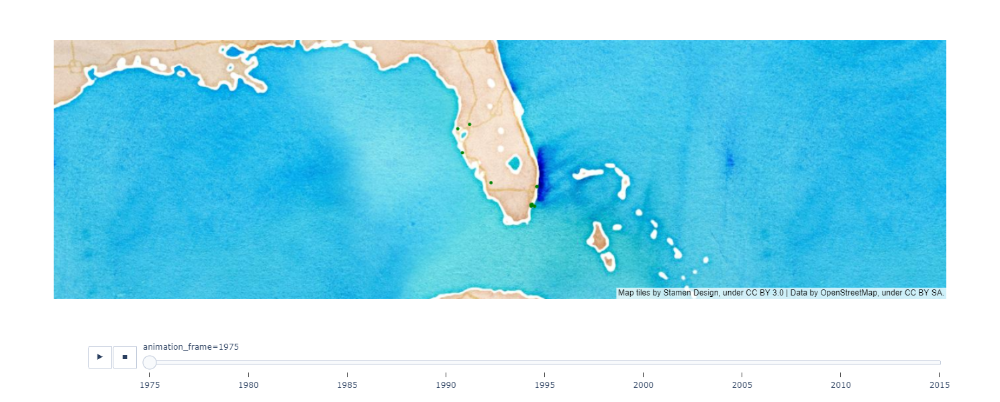

In [17]:
# Animated map of observations of the Monk Parakeet's introduction to and subsequent population growth in Florida

fig = px.scatter_mapbox(
    florida_df,
    lat="Latitude",
    lon="Longitude",
    animation_frame=pd.DatetimeIndex(florida_df["Date"]).year // 5 * 5,
    hover_name="Location",
    hover_data={
        "Date": "|%B %d, %Y",
        "Number Seen": True,
        "Latitude": False,
        "Longitude": False,
    },
    color_discrete_sequence=["green"],
    mapbox_style="stamen-watercolor",
    width=1000,
    height=600,
    zoom=5,
)
fig.show()

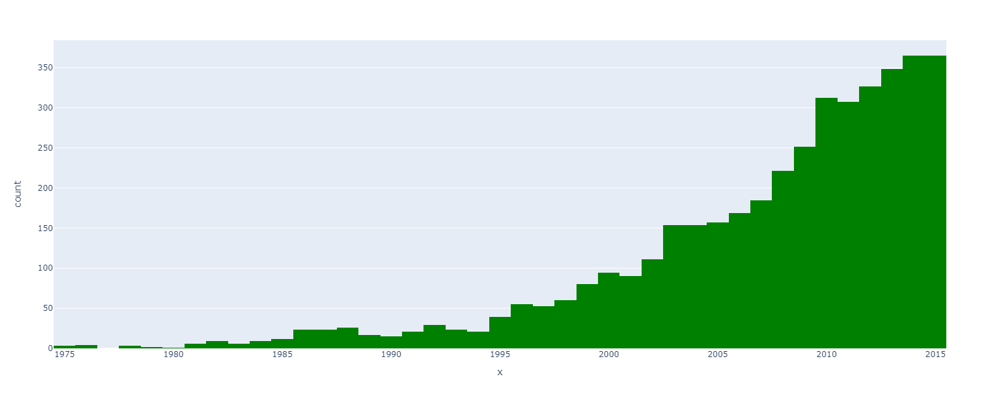

In [18]:
fig = px.histogram(
    x=pd.DatetimeIndex(florida_df["Date"]).year,
    color_discrete_sequence=["green"],
    width=1000,
    height=600,
)
fig.show()

<span style="color:darkgreen">
The Monk Parakeet, scientists believe, have taken over the niche that the Carolina Parakeet once filled.  The chart below plots observations of both species on a logarithmic scale.

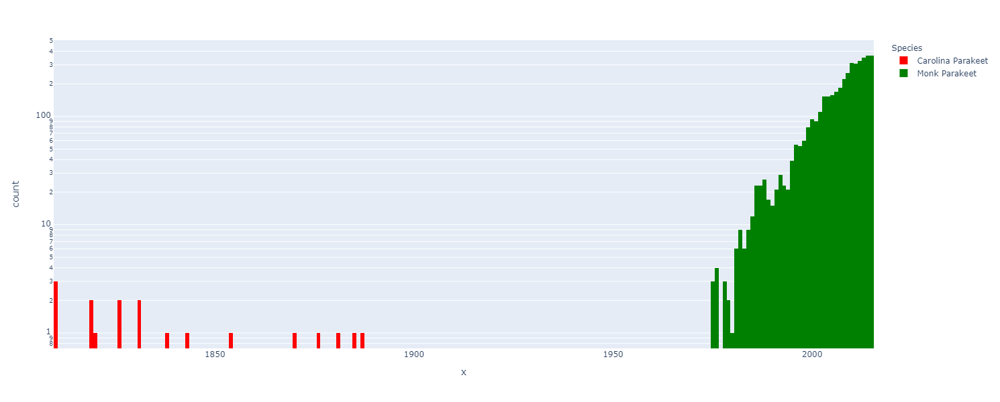

In [19]:
old_new_df = pd.merge(carolina_df, florida_df, how="outer")
fig = px.histogram(
    old_new_df,
    x=pd.DatetimeIndex(old_new_df["Date"]).year,
    log_y=True,
    color="Species",
    color_discrete_sequence=["red", "green"],
    width=1000,
    height=600,
)
fig.show()

### Monk Parakeets in Austin
<span style="color:darkgreen">
<img src="./resources/monk_austin.jpg" alt="Monk parakeets can be found all over Austin — including University of Texas intramural fields in Hyde Park" align="left" width="400px">Monk Parakeets have spread across the southern United States, and Austin, TX is home to one of the largest populations outside of Florida.
    
Using the eBird data, we were able to find some of the first sightings of the Monk Parakeet in Austin after they became established here in the 1970s.

In [20]:
austin_df = (
    pd.read_csv(AUSTIN_PARAKEETS)
    .drop(
        ["speciesCode", "locId", "obsValid", "obsReviewed", "locationPrivate", "subId"],
        axis=1,
    )
    .rename(columns=columns_dict)
)

austin_df["Decade"] = pd.DatetimeIndex(austin_df["Date"]).year // 10 * 10
austin_df["Number Seen"] = austin_df["Number Seen"].fillna(1)

austin_df

,Species,Scientific Name,Location,Date,Number Seen,Latitude,Longitude,Decade
0,Monk Parakeet,Myiopsitta monachus,Auditorium Shores / Disch Field,1981-04-19 16:00,2.0,30.263138,-97.752209,1980
1,Monk Parakeet,Myiopsitta monachus,"Town Lake Park (HOTE 042), Austin",1981-05-24 18:00,4.0,30.264900,-97.759102,1980
2,Monk Parakeet,Myiopsitta monachus,Zilker Park (HOTE 043),1982-05-24 12:00,2.0,30.267000,-97.769997,1980
3,Monk Parakeet,Myiopsitta monachus,Austin,1984-03-11,11.0,30.267111,-97.743080,1980
4,Monk Parakeet,Myiopsitta monachus,Hornsby Bend (HOTE 037),1984-04-14,1.0,30.218199,-97.645805,1980
...,...,...,...,...,...,...,...,...
3085,Monk Parakeet,Myiopsitta monachus,"Town Lake--Shoal Beach, Austin",2019-12-27 15:59,6.0,30.265294,-97.752142,2010
3086,Monk Parakeet,Myiopsitta monachus,New Place,2019-12-28 15:07,4.0,30.328169,-97.718319,2010
3087,Monk Parakeet,Myiopsitta monachus,Hornsby Bend (HOTE 037),2019-12-29 16:28,1.0,30.218199,-97.645805,2010
3088,Monk Parakeet,Myiopsitta monachus,"Lakeshore Park, Austin",2019-12-30 15:30,12.0,30.247000,-97.715200,2010


<span style="color:darkgreen">
In this animation, you can see where people have spotted the Monk Parakeet in Austin over the years.

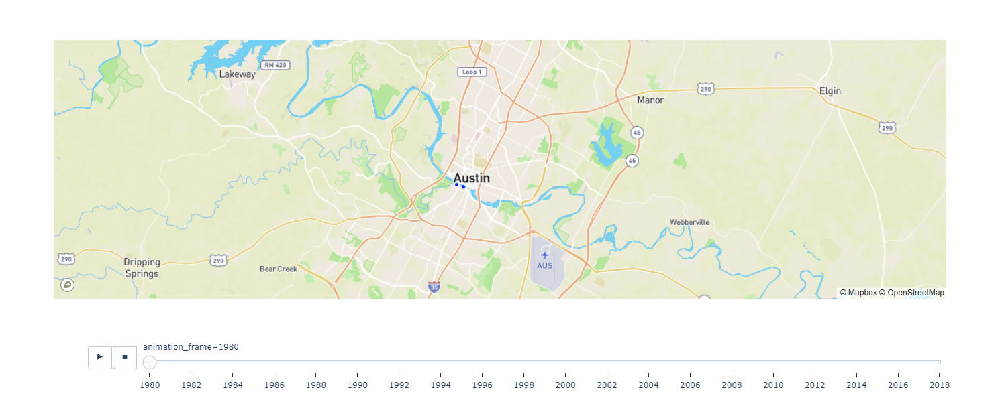

In [21]:
# create the plot
fig = px.scatter_mapbox(
    austin_df,
    lat="Latitude",
    lon="Longitude",
    animation_frame=pd.DatetimeIndex(austin_df["Date"]).year // 2 * 2,
    hover_name="Location",
    hover_data={
        "Date": "|%B %d, %Y",
        "Latitude": False,
        "Longitude": False,
        "Number Seen": True,
    },
    color_discrete_sequence=["blue"],
    mapbox_style="outdoors",
    width=1000,
    height=600,
    zoom=10,
)
fig.show()

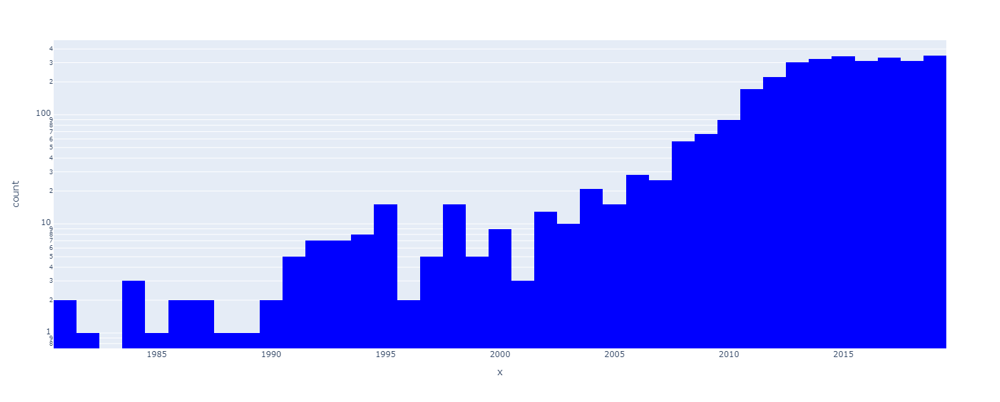

In [22]:
fig = px.histogram(
    x=pd.DatetimeIndex(austin_df["Date"]).year,
    color_discrete_sequence=["blue"],
    width=1000,
    height=600,
    log_y=True,
)
fig.show()

<span style="color:darkgreen">
If you want to spot a parakeet in Austin, you'll want to spend some time along the river or in one of the city's green spaces like the UT intramural fields, the Mueller Park district, or the Pease District Park!

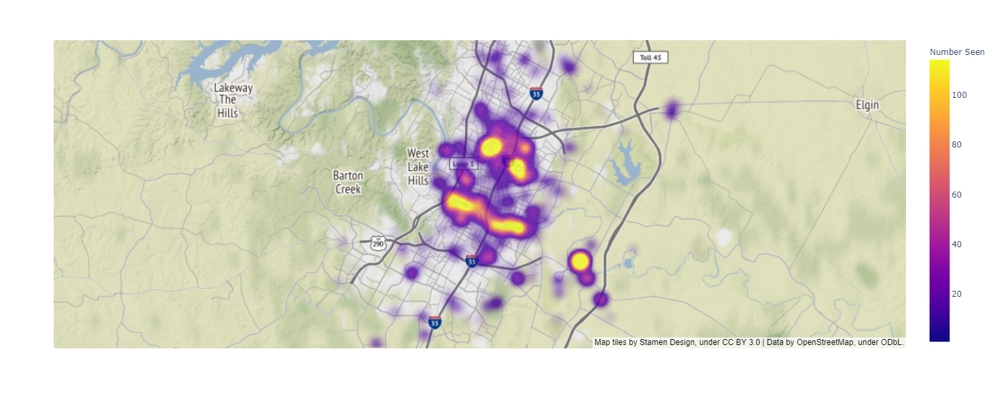

In [23]:
fig = px.density_mapbox(
    austin_df,
    lat="Latitude",
    lon="Longitude",
    mapbox_style="stamen-terrain",
    z="Number Seen",
    radius=20,
    opacity=0.8,
    hover_data={
        "Latitude": False,
        "Longitude": False,
        "Location": True,
        "Number Seen": True,
    },
    zoom=10,
    width=1000,
    height=600,
)
fig.show()